In [216]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import plotly.express as px
from mpl_toolkits.mplot3d import Axes3D

# Load the Dataset
### Reading the weather dataset from a CSV file

In [217]:
Data = pd.read_csv("EnglandWeather.csv")

# Creating a DataFrame from the loaded data


In [218]:
df = pd.DataFrame (Data)

# Displaying the first few rows of the dataset


In [219]:
df.head()

,Formatted Date,Summary,Precip Type,Temperature (C),Wind Speed (km/h),Pressure (millibars),Humidity
0,2006-04-01 00:00:00.000 +0200,Partly Cloudy,rain,9.472222,14.1197,1015.13,0.89
1,2006-04-01 01:00:00.000 +0200,Partly Cloudy,rain,9.355556,14.2646,1015.63,0.86
2,2006-04-01 02:00:00.000 +0200,Mostly Cloudy,rain,9.377778,3.9284,1015.94,0.89
3,2006-04-01 03:00:00.000 +0200,Partly Cloudy,rain,8.288889,14.1036,1016.41,0.83
4,2006-04-01 04:00:00.000 +0200,Mostly Cloudy,rain,8.755556,11.0446,1016.51,0.83


# Data Exploration
### Summary statistics of the dataset

In [220]:
    df.describe()

,Temperature (C),Wind Speed (km/h),Pressure (millibars),Humidity
count,96453.000000,96453.000000,96453.000000,96453.000000
mean,11.932678,10.810640,1003.235956,0.734899
std,9.551546,6.913571,116.969906,0.195473
min,-21.822222,0.000000,0.000000,0.000000
25%,4.688889,5.828200,1011.900000,0.600000
50%,12.000000,9.965900,1016.450000,0.780000
75%,18.838889,14.135800,1021.090000,0.890000
max,39.905556,63.852600,1046.380000,1.000000


# Display column names


In [221]:
print(df.columns)

Index(['Formatted Date', 'Summary', 'Precip Type', 'Temperature (C)',
       'Wind Speed (km/h)', 'Pressure (millibars)', 'Humidity'],
      dtype='object')


# Display dataset information


In [222]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96453 entries, 0 to 96452
Data columns (total 7 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Formatted Date        96453 non-null  object 
 1   Summary               96453 non-null  object 
 2   Precip Type           95936 non-null  object 
 3   Temperature (C)       96453 non-null  float64
 4   Wind Speed (km/h)     96453 non-null  float64
 5   Pressure (millibars)  96453 non-null  float64
 6   Humidity              96453 non-null  float64
dtypes: float64(4), object(3)
memory usage: 5.2+ MB


# Display data types of each column


In [223]:
df.dtypes

Formatted Date           object
Summary                  object
Precip Type              object
Temperature (C)         float64
Wind Speed (km/h)       float64
Pressure (millibars)    float64
Humidity                float64
dtype: object

# Grouping and Unique Values
### Grouping data by Humidity and calculating the mean

In [224]:
grouped = df.groupby('Humidity')
print(grouped.mean())

          Temperature (C)  Wind Speed (km/h)  Pressure (millibars)
Humidity                                                          
0.00           -13.560606           9.568523           1028.333636
0.12            13.888889          28.980000           1028.000000
0.13            39.905556          23.586500           1007.550000
0.14            32.637500          15.415750           1016.712500
0.15            25.514444          18.880470           1016.724000
...                   ...                ...                   ...
0.96             5.595618           7.590989           1010.848012
0.97            13.613889           6.666064           1011.898196
0.98             5.327339           7.739709           1019.139723
0.99             4.650046           7.588719           1013.055070
1.00             4.502276           7.586292            996.655599

[90 rows x 3 columns]


# Display unique values of categorical columns

In [225]:
df['Summary'].unique()

array(['Partly Cloudy', 'Mostly Cloudy', 'Overcast', 'Foggy',
       'Breezy and Mostly Cloudy', 'Clear', 'Breezy and Partly Cloudy',
       'Breezy and Overcast', 'Humid and Mostly Cloudy',
       'Humid and Partly Cloudy', 'Windy and Foggy', 'Windy and Overcast',
       'Breezy and Foggy', 'Windy and Partly Cloudy', 'Breezy',
       'Dry and Partly Cloudy', 'Windy and Mostly Cloudy',
       'Dangerously Windy and Partly Cloudy', 'Dry', 'Windy',
       'Humid and Overcast', 'Light Rain', 'Drizzle', 'Windy and Dry',
       'Dry and Mostly Cloudy', 'Breezy and Dry', 'Rain'], dtype=object)

In [226]:
df['Precip Type'].unique()

array(['rain', 'snow', nan], dtype=object)

# Counting occurrences of categorical values

In [227]:
df['Summary'].value_counts()

Partly Cloudy                          31733
Mostly Cloudy                          28094
Overcast                               16597
Clear                                  10890
Foggy                                   7148
Breezy and Overcast                      528
Breezy and Mostly Cloudy                 516
Breezy and Partly Cloudy                 386
Dry and Partly Cloudy                     86
Windy and Partly Cloudy                   67
Light Rain                                63
Breezy                                    54
Windy and Overcast                        45
Humid and Mostly Cloudy                   40
Drizzle                                   39
Breezy and Foggy                          35
Windy and Mostly Cloudy                   35
Dry                                       34
Humid and Partly Cloudy                   17
Dry and Mostly Cloudy                     14
Rain                                      10
Windy                                      8
Humid and 

In [228]:
df['Precip Type'].value_counts()


rain    85224
snow    10712
Name: Precip Type, dtype: int64

# Handling Missing Values
### Checking for missing values

In [229]:
df['Precip Type'].isnull().sum()

517

# Removing rows with missing values

In [230]:
df = df.dropna()

# Selecting Numerical Columns


In [231]:
df2 = pd.DataFrame(Data, columns=['Formatted Date', 'Temperature (C)', 'Wind Speed (km/h)', 'Pressure (millibars)', 'Humidity'])

In [232]:
df2

,Formatted Date,Temperature (C),Wind Speed (km/h),Pressure (millibars),Humidity
0,2006-04-01 00:00:00.000 +0200,9.472222,14.1197,1015.13,0.89
1,2006-04-01 01:00:00.000 +0200,9.355556,14.2646,1015.63,0.86
2,2006-04-01 02:00:00.000 +0200,9.377778,3.9284,1015.94,0.89
3,2006-04-01 03:00:00.000 +0200,8.288889,14.1036,1016.41,0.83
4,2006-04-01 04:00:00.000 +0200,8.755556,11.0446,1016.51,0.83
...,...,...,...,...,...
96448,2016-09-09 19:00:00.000 +0200,26.016667,10.9963,1014.36,0.43
96449,2016-09-09 20:00:00.000 +0200,24.583333,10.0947,1015.16,0.48
96450,2016-09-09 21:00:00.000 +0200,22.038889,8.9838,1015.66,0.56
96451,2016-09-09 22:00:00.000 +0200,21.522222,10.5294,1015.95,0.60


In [233]:
df2.describe()

,Temperature (C),Wind Speed (km/h),Pressure (millibars),Humidity
count,96453.000000,96453.000000,96453.000000,96453.000000
mean,11.932678,10.810640,1003.235956,0.734899
std,9.551546,6.913571,116.969906,0.195473
min,-21.822222,0.000000,0.000000,0.000000
25%,4.688889,5.828200,1011.900000,0.600000
50%,12.000000,9.965900,1016.450000,0.780000
75%,18.838889,14.135800,1021.090000,0.890000
max,39.905556,63.852600,1046.380000,1.000000


# Data Visualization
### Scatter plot: Temperature vs. Humidity

Text(0.5, 1.0, 'Temperature vs. Humidity')

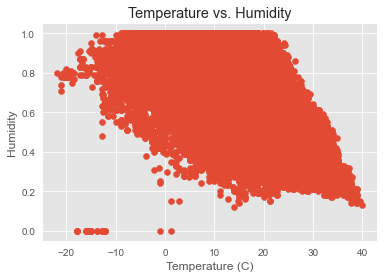

In [234]:
plt.scatter(df2['Temperature (C)'], df2['Humidity'])
plt.xlabel("Temperature (C)")
plt.ylabel("Humidity")
plt.title("Temperature vs. Humidity")

# Scatter plot: Wind Speed vs. Humidity

Text(0.5, 1.0, 'Wind Speed vs. Humidity')

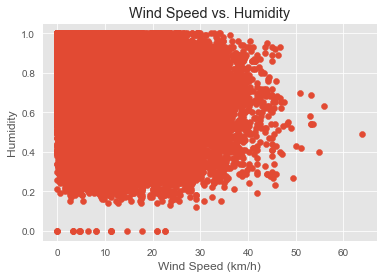

In [235]:
plt.scatter(df2['Wind Speed (km/h)'], df2['Humidity'])
plt.xlabel("Wind Speed (km/h)")
plt.ylabel("Humidity")
plt.title("Wind Speed vs. Humidity")

# Scatter plot: Pressure vs. Humidity


Text(0.5, 1.0, 'Pressure vs. Humidity')

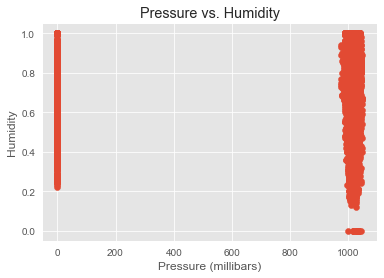

In [236]:
plt.scatter(df2['Pressure (millibars)'], df2['Humidity'])
plt.xlabel("Pressure (millibars)")
plt.ylabel("Humidity")
plt.title("Pressure vs. Humidity")

In [237]:
### Humidity = 0
### Wind Speed < 50
## Pressure > 200

In [238]:
df2

,Formatted Date,Temperature (C),Wind Speed (km/h),Pressure (millibars),Humidity
0,2006-04-01 00:00:00.000 +0200,9.472222,14.1197,1015.13,0.89
1,2006-04-01 01:00:00.000 +0200,9.355556,14.2646,1015.63,0.86
2,2006-04-01 02:00:00.000 +0200,9.377778,3.9284,1015.94,0.89
3,2006-04-01 03:00:00.000 +0200,8.288889,14.1036,1016.41,0.83
4,2006-04-01 04:00:00.000 +0200,8.755556,11.0446,1016.51,0.83
...,...,...,...,...,...
96448,2016-09-09 19:00:00.000 +0200,26.016667,10.9963,1014.36,0.43
96449,2016-09-09 20:00:00.000 +0200,24.583333,10.0947,1015.16,0.48
96450,2016-09-09 21:00:00.000 +0200,22.038889,8.9838,1015.66,0.56
96451,2016-09-09 22:00:00.000 +0200,21.522222,10.5294,1015.95,0.60


In [239]:
df2.describe()

,Temperature (C),Wind Speed (km/h),Pressure (millibars),Humidity
count,96453.000000,96453.000000,96453.000000,96453.000000
mean,11.932678,10.810640,1003.235956,0.734899
std,9.551546,6.913571,116.969906,0.195473
min,-21.822222,0.000000,0.000000,0.000000
25%,4.688889,5.828200,1011.900000,0.600000
50%,12.000000,9.965900,1016.450000,0.780000
75%,18.838889,14.135800,1021.090000,0.890000
max,39.905556,63.852600,1046.380000,1.000000


# Check for missing values in the dataframe

In [240]:
print("\n Show the missing value of DataFrame :\n\n", df2.isnull().sum())


 Show the missing value of DataFrame :

 Formatted Date          0
Temperature (C)         0
Wind Speed (km/h)       0
Pressure (millibars)    0
Humidity                0
dtype: int64


In [241]:
small = df2["Humidity"].nsmallest(80)
small

19958    0.00
28101    0.00
28103    0.00
28110    0.00
29627    0.00
         ... 
53917    0.18
53919    0.18
53921    0.18
57807    0.18
57927    0.18
Name: Humidity, Length: 80, dtype: float64

# Handling Noisy Data
### Removing noise from Humidity column

In [242]:
df3 = df2[df2["Humidity"] != 0]
df3

,Formatted Date,Temperature (C),Wind Speed (km/h),Pressure (millibars),Humidity
0,2006-04-01 00:00:00.000 +0200,9.472222,14.1197,1015.13,0.89
1,2006-04-01 01:00:00.000 +0200,9.355556,14.2646,1015.63,0.86
2,2006-04-01 02:00:00.000 +0200,9.377778,3.9284,1015.94,0.89
3,2006-04-01 03:00:00.000 +0200,8.288889,14.1036,1016.41,0.83
4,2006-04-01 04:00:00.000 +0200,8.755556,11.0446,1016.51,0.83
...,...,...,...,...,...
96448,2016-09-09 19:00:00.000 +0200,26.016667,10.9963,1014.36,0.43
96449,2016-09-09 20:00:00.000 +0200,24.583333,10.0947,1015.16,0.48
96450,2016-09-09 21:00:00.000 +0200,22.038889,8.9838,1015.66,0.56
96451,2016-09-09 22:00:00.000 +0200,21.522222,10.5294,1015.95,0.60


## Removal of Humidity column noises

Text(0.5, 1.0, 'Temperature vs. Humidity')

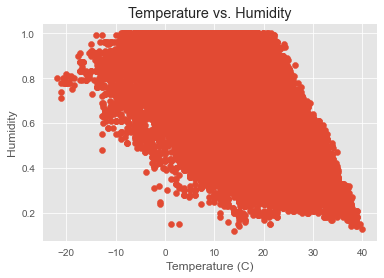

In [243]:
plt.scatter(df3['Temperature (C)'], df3['Humidity'])
plt.xlabel("Temperature (C)")
plt.ylabel("Humidity")
plt.title("Temperature vs. Humidity")

In [244]:
High = df3["Wind Speed (km/h)"].nlargest(20)
High

12181    63.8526
20927    55.9314
75398    54.8849
12182    53.5969
12179    53.2427
12180    53.1944
20928    53.1944
12183    52.9368
75438    51.1497
20915    50.9726
63542    50.1354
44532    49.3948
12178    49.0567
31641    48.3000
64860    48.2034
11002    47.5272
11005    47.2857
44554    47.0925
11508    46.8349
11909    46.8349
Name: Wind Speed (km/h), dtype: float64

# Removing noise from Wind Speed column

In [245]:
df4 = df3[df3["Wind Speed (km/h)"] <60]
df4

,Formatted Date,Temperature (C),Wind Speed (km/h),Pressure (millibars),Humidity
0,2006-04-01 00:00:00.000 +0200,9.472222,14.1197,1015.13,0.89
1,2006-04-01 01:00:00.000 +0200,9.355556,14.2646,1015.63,0.86
2,2006-04-01 02:00:00.000 +0200,9.377778,3.9284,1015.94,0.89
3,2006-04-01 03:00:00.000 +0200,8.288889,14.1036,1016.41,0.83
4,2006-04-01 04:00:00.000 +0200,8.755556,11.0446,1016.51,0.83
...,...,...,...,...,...
96448,2016-09-09 19:00:00.000 +0200,26.016667,10.9963,1014.36,0.43
96449,2016-09-09 20:00:00.000 +0200,24.583333,10.0947,1015.16,0.48
96450,2016-09-09 21:00:00.000 +0200,22.038889,8.9838,1015.66,0.56
96451,2016-09-09 22:00:00.000 +0200,21.522222,10.5294,1015.95,0.60


## Removal of Wind Speed column noises

Text(0.5, 1.0, 'Wind Speed vs. Humidity')

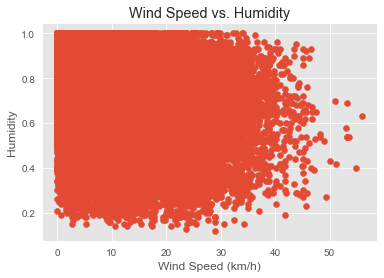

In [246]:
plt.scatter(df4['Wind Speed (km/h)'], df4['Humidity'])
plt.xlabel("Wind Speed (km/h)")
plt.ylabel("Humidity")
plt.title("Wind Speed vs. Humidity")

Text(0.5, 1.0, 'Pressure vs. Humidity')

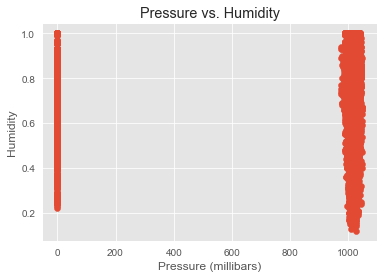

In [247]:
plt.scatter(df4['Pressure (millibars)'], df4['Humidity'])
plt.xlabel("Pressure (millibars)")
plt.ylabel("Humidity")
plt.title("Pressure vs. Humidity")

In [248]:
df4

,Formatted Date,Temperature (C),Wind Speed (km/h),Pressure (millibars),Humidity
0,2006-04-01 00:00:00.000 +0200,9.472222,14.1197,1015.13,0.89
1,2006-04-01 01:00:00.000 +0200,9.355556,14.2646,1015.63,0.86
2,2006-04-01 02:00:00.000 +0200,9.377778,3.9284,1015.94,0.89
3,2006-04-01 03:00:00.000 +0200,8.288889,14.1036,1016.41,0.83
4,2006-04-01 04:00:00.000 +0200,8.755556,11.0446,1016.51,0.83
...,...,...,...,...,...
96448,2016-09-09 19:00:00.000 +0200,26.016667,10.9963,1014.36,0.43
96449,2016-09-09 20:00:00.000 +0200,24.583333,10.0947,1015.16,0.48
96450,2016-09-09 21:00:00.000 +0200,22.038889,8.9838,1015.66,0.56
96451,2016-09-09 22:00:00.000 +0200,21.522222,10.5294,1015.95,0.60


In [249]:
df4.describe()

,Temperature (C),Wind Speed (km/h),Pressure (millibars),Humidity
count,96430.000000,96430.000000,96430.000000,96430.000000
mean,11.938526,10.810373,1003.230170,0.735069
std,9.544653,6.911376,116.983161,0.195179
min,-21.822222,0.000000,0.000000,0.120000
25%,4.705556,5.828200,1011.900000,0.600000
50%,12.008333,9.965900,1016.440000,0.780000
75%,18.838889,14.135800,1021.090000,0.890000
max,39.905556,55.931400,1046.380000,1.000000


# Removing noise from Pressure column

In [250]:
DF = df4[df4["Pressure (millibars)"] > 200]
DF

,Formatted Date,Temperature (C),Wind Speed (km/h),Pressure (millibars),Humidity
0,2006-04-01 00:00:00.000 +0200,9.472222,14.1197,1015.13,0.89
1,2006-04-01 01:00:00.000 +0200,9.355556,14.2646,1015.63,0.86
2,2006-04-01 02:00:00.000 +0200,9.377778,3.9284,1015.94,0.89
3,2006-04-01 03:00:00.000 +0200,8.288889,14.1036,1016.41,0.83
4,2006-04-01 04:00:00.000 +0200,8.755556,11.0446,1016.51,0.83
...,...,...,...,...,...
96448,2016-09-09 19:00:00.000 +0200,26.016667,10.9963,1014.36,0.43
96449,2016-09-09 20:00:00.000 +0200,24.583333,10.0947,1015.16,0.48
96450,2016-09-09 21:00:00.000 +0200,22.038889,8.9838,1015.66,0.56
96451,2016-09-09 22:00:00.000 +0200,21.522222,10.5294,1015.95,0.60


## Removal of Pressure column noises

Text(0.5, 1.0, 'Pressure vs. Humidity')

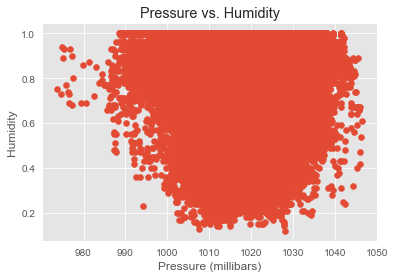

In [251]:
plt.scatter(DF['Pressure (millibars)'], DF['Humidity'])
plt.xlabel("Pressure (millibars)")
plt.ylabel("Humidity")
plt.title("Pressure vs. Humidity")

##  Initial plot for temperature-humidity diagram

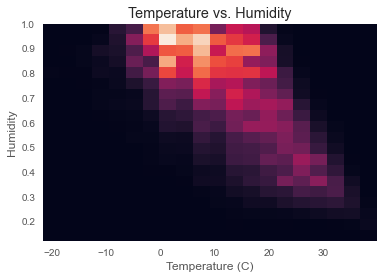

In [252]:
plt.style.use('ggplot')
fig, ax = plt.subplots()
ax.hist2d(DF['Temperature (C)'], DF['Humidity'], bins=20, )
plt.xlabel("Temperature (C)")
plt.ylabel("Humidity")
plt.title("Temperature vs. Humidity")
plt.show()

## Initial plot for WindSpeed-humidity diagram

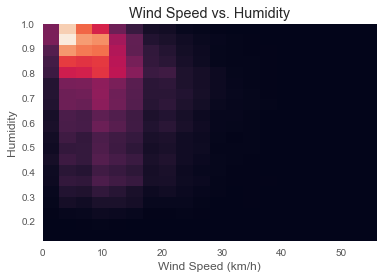

In [253]:
plt.style.use('ggplot')
fig, ax = plt.subplots()
ax.hist2d(DF['Wind Speed (km/h)'], DF['Humidity'], bins=20, )
plt.xlabel("Wind Speed (km/h)")
plt.ylabel("Humidity")
plt.title("Wind Speed vs. Humidity")
plt.show()

## Initial plot for Pressure-humidity diagram

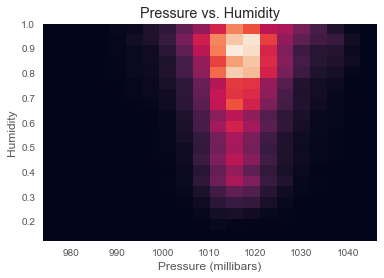

In [254]:
plt.style.use('ggplot')
fig, ax = plt.subplots()
ax.hist2d(DF['Pressure (millibars)'], DF['Humidity'], bins=20, )
plt.xlabel("Pressure (millibars)")
plt.ylabel("Humidity")
plt.title("Pressure vs. Humidity")
plt.show()

# Heatmap Visualizations


In [255]:
fig = px.density_contour(DF, x="Temperature (C)", y="Humidity", title="Temperature vs. Humidity")
fig.update_traces(contours_coloring="heatmap", contours_showlabels = True)

fig.show()

## Temperature-humidity heatmap plot

- The highest level of humidity "0.9" has always happened at 3 degrees Celsius
- The amount of air humidity increases significantly from -5 degrees Celsius to above
- The amount of air humidity decreases significantly from the temperature of 15 degrees Celsius
- The highest amount of humidity has always occurred in the temperature range of -3 to 13 degrees Celsius
- 100% humidity occurred at 3 degrees Celsius
- At temperatures above 25 degrees Celsius, humidity is never higher than 50%
- The highest number of temperatures recorded in England was 3 degrees Celsius
- The highest number of recorded humidity in England has always been between 80% and 95%

In [256]:
fig = px.density_contour(DF, x="Wind Speed (km/h)", y="Humidity", title="Wind Speed vs. Humidity")
fig.update_traces(contours_coloring="heatmap", contours_showlabels = True)
fig.show()

## WindSpeed-humidity heatmap plot

- The highest level of humidity "0.9" has always happened at 3 km/h 
- The amount of air humidity increases significantly from  2 km/h to above
- The amount of air humidity decreases significantly from the 14 km/h Wind Speed
- The highest amount of humidity has always occurred in the wind speed range of 2 to 12 km/h
- 100% humidity occurred at 3 km/h
- At wind speed above 20 km/h, humidity is never higher than 80%
- The highest number of wind speed recorded in England was 3 km/h
- The highest number of recorded humidity in England has always been between 80% and 95%

In [257]:
fig = px.density_contour(DF, x="Pressure (millibars)", y="Humidity", title="Pressure vs. Humidity")
fig.update_traces(contours_coloring="heatmap", contours_showlabels = True)
fig.show()

## Pressure-humidity heatmap plot

- The highest level of humidity "1" has always happened in the Pressure range of 1009.5 to 1026.5 millibars 
- The amount of air humidity increases significantly from  1001.5 millibars to above
- The amount of air humidity decreases significantly from the 1028.5 millibars pressure
- At Pressure above 1030.5 millibars, humidity is never higher than 80%
- The highest number of Pressure recorded in England was 1019.5 millibars
- The highest number of recorded humidity in England has always been between 80% and 95%
- Pressure in the UK rarely rises above 1040 millibars
- Pressure in the UK rarely drops below 1000 millibars

In [258]:
DF

,Formatted Date,Temperature (C),Wind Speed (km/h),Pressure (millibars),Humidity
0,2006-04-01 00:00:00.000 +0200,9.472222,14.1197,1015.13,0.89
1,2006-04-01 01:00:00.000 +0200,9.355556,14.2646,1015.63,0.86
2,2006-04-01 02:00:00.000 +0200,9.377778,3.9284,1015.94,0.89
3,2006-04-01 03:00:00.000 +0200,8.288889,14.1036,1016.41,0.83
4,2006-04-01 04:00:00.000 +0200,8.755556,11.0446,1016.51,0.83
...,...,...,...,...,...
96448,2016-09-09 19:00:00.000 +0200,26.016667,10.9963,1014.36,0.43
96449,2016-09-09 20:00:00.000 +0200,24.583333,10.0947,1015.16,0.48
96450,2016-09-09 21:00:00.000 +0200,22.038889,8.9838,1015.66,0.56
96451,2016-09-09 22:00:00.000 +0200,21.522222,10.5294,1015.95,0.60


# Handling Date Column
### Convert Formatted Date column to datetime format

In [259]:
DF['Formatted Date'] = pd.to_datetime(DF['Formatted Date'], utc=True )

C:\Users\abbas\AppData\Local\Temp/ipykernel_16192/3559319753.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## Change Date columns format to datetime

In [260]:
DF

,Formatted Date,Temperature (C),Wind Speed (km/h),Pressure (millibars),Humidity
0,2006-03-31 22:00:00+00:00,9.472222,14.1197,1015.13,0.89
1,2006-03-31 23:00:00+00:00,9.355556,14.2646,1015.63,0.86
2,2006-04-01 00:00:00+00:00,9.377778,3.9284,1015.94,0.89
3,2006-04-01 01:00:00+00:00,8.288889,14.1036,1016.41,0.83
4,2006-04-01 02:00:00+00:00,8.755556,11.0446,1016.51,0.83
...,...,...,...,...,...
96448,2016-09-09 17:00:00+00:00,26.016667,10.9963,1014.36,0.43
96449,2016-09-09 18:00:00+00:00,24.583333,10.0947,1015.16,0.48
96450,2016-09-09 19:00:00+00:00,22.038889,8.9838,1015.66,0.56
96451,2016-09-09 20:00:00+00:00,21.522222,10.5294,1015.95,0.60


# Convert Date column to year-month format


In [261]:
DF['Formatted Date'] = pd.to_datetime(DF['Formatted Date']).dt.to_period("M")

C:\Users\abbas\anaconda3\lib\site-packages\pandas\core\arrays\datetimes.py:1143: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.

C:\Users\abbas\AppData\Local\Temp/ipykernel_16192/3543342759.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [262]:
DF

,Formatted Date,Temperature (C),Wind Speed (km/h),Pressure (millibars),Humidity
0,2006-03,9.472222,14.1197,1015.13,0.89
1,2006-03,9.355556,14.2646,1015.63,0.86
2,2006-04,9.377778,3.9284,1015.94,0.89
3,2006-04,8.288889,14.1036,1016.41,0.83
4,2006-04,8.755556,11.0446,1016.51,0.83
...,...,...,...,...,...
96448,2016-09,26.016667,10.9963,1014.36,0.43
96449,2016-09,24.583333,10.0947,1015.16,0.48
96450,2016-09,22.038889,8.9838,1015.66,0.56
96451,2016-09,21.522222,10.5294,1015.95,0.60


# Filtering data for years after 2005


In [263]:
period = pd.Period('2005-12', freq='M')
DF = DF[DF['Formatted Date'] > period]

In [264]:
DF

,Formatted Date,Temperature (C),Wind Speed (km/h),Pressure (millibars),Humidity
0,2006-03,9.472222,14.1197,1015.13,0.89
1,2006-03,9.355556,14.2646,1015.63,0.86
2,2006-04,9.377778,3.9284,1015.94,0.89
3,2006-04,8.288889,14.1036,1016.41,0.83
4,2006-04,8.755556,11.0446,1016.51,0.83
...,...,...,...,...,...
96448,2016-09,26.016667,10.9963,1014.36,0.43
96449,2016-09,24.583333,10.0947,1015.16,0.48
96450,2016-09,22.038889,8.9838,1015.66,0.56
96451,2016-09,21.522222,10.5294,1015.95,0.60


In [265]:
DF1 = df4
DF1['Formatted Date'] = pd.to_datetime(DF1['Formatted Date'], utc=True )


C:\Users\abbas\AppData\Local\Temp/ipykernel_16192/2037607383.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# Convert Date column to yearly format

In [266]:
DF1['Formatted Date'] = pd.to_datetime(DF1['Formatted Date']).dt.year

C:\Users\abbas\AppData\Local\Temp/ipykernel_16192/739303351.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [267]:
DF1

,Formatted Date,Temperature (C),Wind Speed (km/h),Pressure (millibars),Humidity
0,2006,9.472222,14.1197,1015.13,0.89
1,2006,9.355556,14.2646,1015.63,0.86
2,2006,9.377778,3.9284,1015.94,0.89
3,2006,8.288889,14.1036,1016.41,0.83
4,2006,8.755556,11.0446,1016.51,0.83
...,...,...,...,...,...
96448,2016,26.016667,10.9963,1014.36,0.43
96449,2016,24.583333,10.0947,1015.16,0.48
96450,2016,22.038889,8.9838,1015.66,0.56
96451,2016,21.522222,10.5294,1015.95,0.60


# Filtering data for years after 2005

In [268]:
DF1 = DF1[DF1['Formatted Date'] > 2005]

In [269]:
DF1

,Formatted Date,Temperature (C),Wind Speed (km/h),Pressure (millibars),Humidity
0,2006,9.472222,14.1197,1015.13,0.89
1,2006,9.355556,14.2646,1015.63,0.86
2,2006,9.377778,3.9284,1015.94,0.89
3,2006,8.288889,14.1036,1016.41,0.83
4,2006,8.755556,11.0446,1016.51,0.83
...,...,...,...,...,...
96448,2016,26.016667,10.9963,1014.36,0.43
96449,2016,24.583333,10.0947,1015.16,0.48
96450,2016,22.038889,8.9838,1015.66,0.56
96451,2016,21.522222,10.5294,1015.95,0.60


# Sorting by date


In [270]:
DF1 = DF1.sort_values(by='Formatted Date')


In [271]:
DF1

,Formatted Date,Temperature (C),Wind Speed (km/h),Pressure (millibars),Humidity
0,2006,9.472222,14.1197,1015.13,0.89
5849,2006,12.222222,7.6153,1015.99,0.86
5848,2006,12.816667,9.3702,1015.56,0.84
5847,2006,12.711111,10.1913,1015.14,0.83
5846,2006,13.705556,13.2986,1014.87,0.78
...,...,...,...,...,...
90597,2016,3.150000,6.0375,1006.92,0.96
90598,2016,2.494444,3.0751,1006.80,0.92
90599,2016,2.638889,3.1556,1006.29,0.96
90593,2016,-2.850000,3.1556,1027.70,0.79


# Data Count per Year

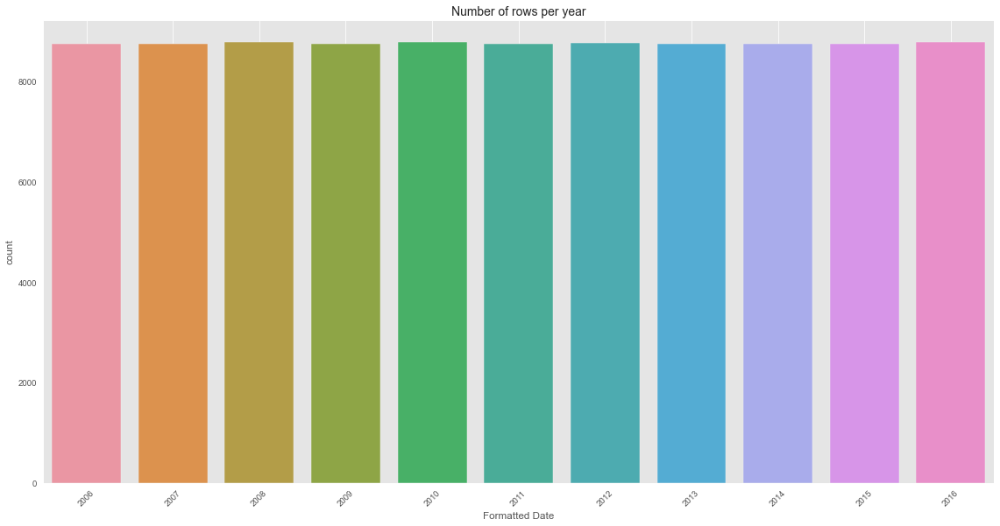

In [272]:
plt.figure(figsize  = (20, 10), dpi=70)
plt.title('Number of rows per year')
sns.countplot (x = DF1['Formatted Date'])
plt.xticks(rotation = 45)
plt.grid()
plt.show()

## Number of recorded data per year
- All the data recorded in this database was in a period of 10 years, from 2006 to 2016
- The data recorded in all these years is almost equal to and above 8000 data per year

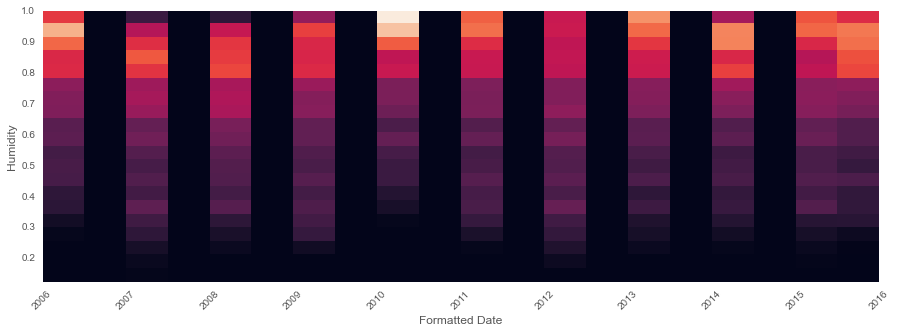

In [273]:
plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(15,5))
ax.hist2d(DF1['Formatted Date'], DF1['Humidity'], bins=20)
plt.xlabel("Formatted Date")
plt.ylabel("Humidity")
x = [2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016]
plt.xticks(np.arange(min(x), max(x)+1, 1), rotation = 45)
plt.show()

## Time-Humidity plot
- Humidity has been decreasing between 2006 and 2010
- humidity has increased suddenly in 2010
- The highest amount of humidity is in 2010
- The lowest amount of  humidity is in 2012
- Humidity has increased again since 2013

# 3D Scatter Plots

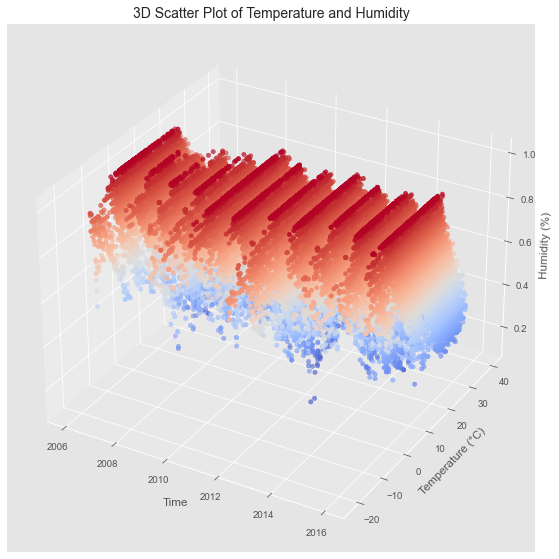

In [274]:
fig = plt.figure(figsize  = (20, 10), dpi=70)
ax = fig.add_subplot(111, projection='3d')
ax.scatter(DF1['Formatted Date'], DF1["Temperature (C)"], DF1['Humidity'], c=DF1['Humidity'], cmap='coolwarm')
ax.set_xlabel("Time")
ax.set_ylabel("Temperature (°C)")
ax.set_zlabel("Humidity (%)")
plt.title("3D Scatter Plot of Temperature and Humidity")
plt.show()

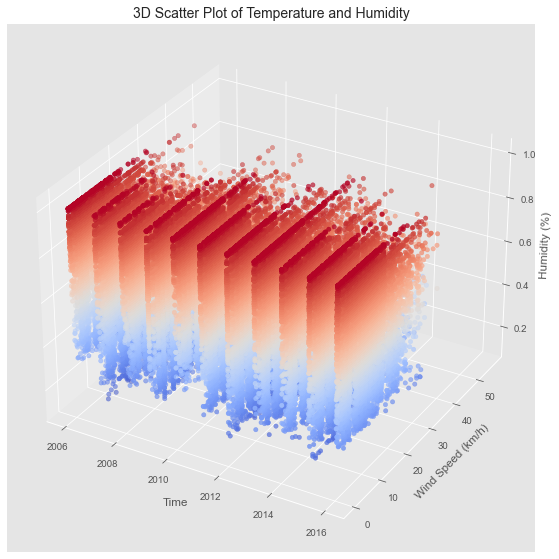

In [275]:
fig = plt.figure(figsize  = (20, 10), dpi=70)
ax = fig.add_subplot(111, projection='3d')
ax.scatter(DF1['Formatted Date'], DF1["Wind Speed (km/h)"], DF1['Humidity'], c=DF1['Humidity'], cmap='coolwarm')
ax.set_xlabel("Time")
ax.set_ylabel("Wind Speed (km/h)")
ax.set_zlabel("Humidity (%)")
plt.title("3D Scatter Plot of Temperature and Humidity")
plt.show()